In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [2]:
# Load the data
df = pd.read_csv('loan_approval_dataset.csv')

In [3]:
df.head()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
0,1,2,Graduate,No,9600000,29900000,12,778,2400000,17600000,22700000,8000000,Approved
1,2,0,Not Graduate,Yes,4100000,12200000,8,417,2700000,2200000,8800000,3300000,Rejected
2,3,3,Graduate,No,9100000,29700000,20,506,7100000,4500000,33300000,12800000,Rejected
3,4,3,Graduate,No,8200000,30700000,8,467,18200000,3300000,23300000,7900000,Rejected
4,5,5,Not Graduate,Yes,9800000,24200000,20,382,12400000,8200000,29400000,5000000,Rejected


In [4]:
# Clean column names by stripping leading/trailing whitespaces
df.columns = df.columns.str.strip()

In [5]:
# Display the cleaned column names to ensure correctness
print(df.columns)

Index(['loan_id', 'no_of_dependents', 'education', 'self_employed',
       'income_annum', 'loan_amount', 'loan_term', 'cibil_score',
       'residential_assets_value', 'commercial_assets_value',
       'luxury_assets_value', 'bank_asset_value', 'loan_status'],
      dtype='object')


In [8]:
df.shape


(4269, 13)

In [9]:
df.describe()

,loan_id,no_of_dependents,education,self_employed,income_annum,loan_amount,loan_term,cibil_score,residential_assets_value,commercial_assets_value,luxury_assets_value,bank_asset_value,loan_status
count,4269.000000,4269.000000,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4269.000000,4269.000000,4.269000e+03,4.269000e+03,4.269000e+03,4.269000e+03,4269.000000
mean,2135.000000,2.498712,0.497775,0.503631,5.059124e+06,1.513345e+07,10.900445,599.936051,7.472617e+06,4.973155e+06,1.512631e+07,4.976692e+06,0.377840
std,1232.498479,1.695910,0.500054,0.500045,2.806840e+06,9.043363e+06,5.709187,172.430401,6.503637e+06,4.388966e+06,9.103754e+06,3.250185e+06,0.484904
min,1.000000,0.000000,0.000000,0.000000,2.000000e+05,3.000000e+05,2.000000,300.000000,-1.000000e+05,0.000000e+00,3.000000e+05,0.000000e+00,0.000000
25%,1068.000000,1.000000,0.000000,0.000000,2.700000e+06,7.700000e+06,6.000000,453.000000,2.200000e+06,1.300000e+06,7.500000e+06,2.300000e+06,0.000000
50%,2135.000000,3.000000,0.000000,1.000000,5.100000e+06,1.450000e+07,10.000000,600.000000,5.600000e+06,3.700000e+06,1.460000e+07,4.600000e+06,0.000000
75%,3202.000000,4.000000,1.000000,1.000000,7.500000e+06,2.150000e+07,16.000000,748.000000,1.130000e+07,7.600000e+06,2.170000e+07,7.100000e+06,1.000000
max,4269.000000,5.000000,1.000000,1.000000,9.900000e+06,3.950000e+07,20.000000,900.000000,2.910000e+07,1.940000e+07,3.920000e+07,1.470000e+07,1.000000


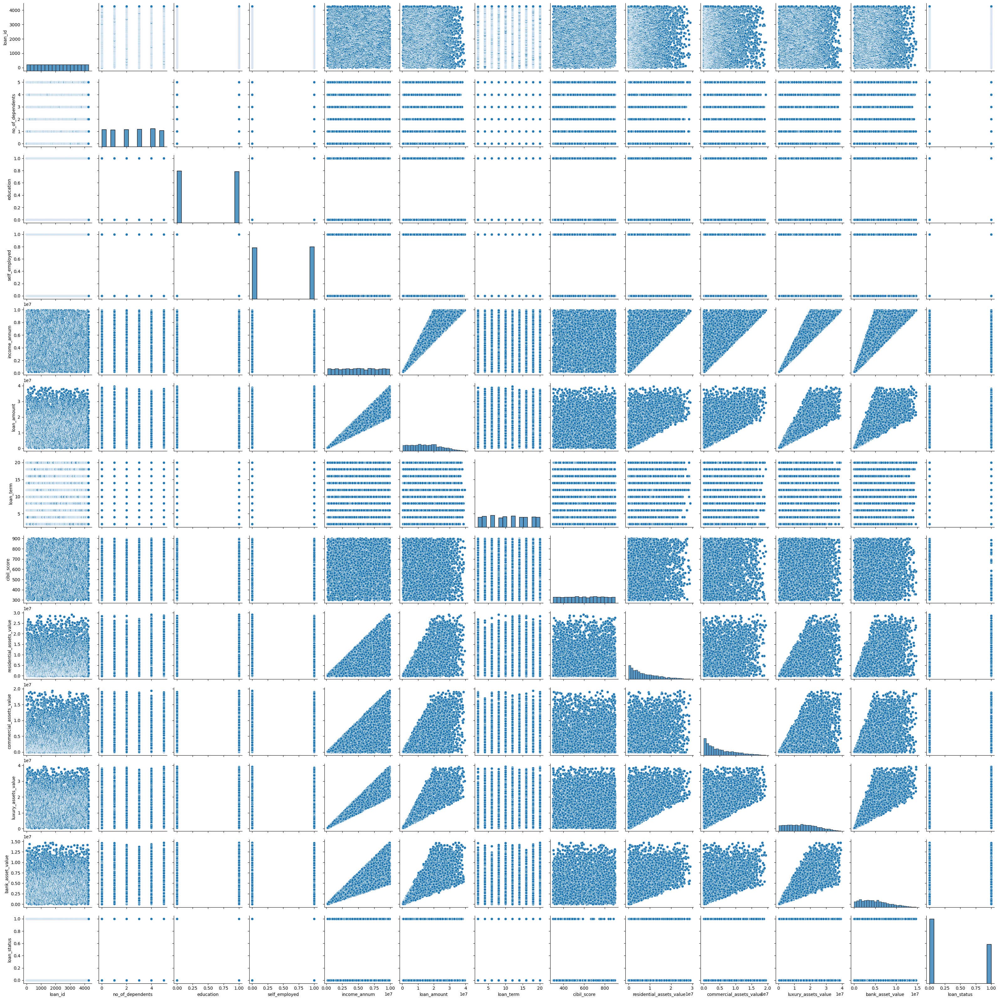

In [10]:
sns.pairplot(df)

In [11]:
# Data Preprocessing
# Encode categorical variables
le = LabelEncoder()
df['education'] = le.fit_transform(df['education'])
df['self_employed'] = le.fit_transform(df['self_employed'])
df['loan_status'] = le.fit_transform(df['loan_status'])  # Approved=0, Rejected=1

In [12]:
# Features and target variable
X = df.drop(['loan_id', 'loan_status'], axis=1)
y = df['loan_status']

In [13]:
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [14]:
# Feature Scaling
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


In [15]:
# Model Building and Evaluation
models = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier()
}


In [16]:
for model_name, model in models.items():
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict(X_test_scaled)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{model_name} Accuracy: {accuracy}")
    print(f"{model_name} Classification Report:\n{classification_report(y_test, y_pred)}")
    print(f"{model_name} Confusion Matrix:\n{confusion_matrix(y_test, y_pred)}\n")

Logistic Regression Accuracy: 0.905152224824356
Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       536
           1       0.88      0.86      0.87       318

    accuracy                           0.91       854
   macro avg       0.90      0.90      0.90       854
weighted avg       0.90      0.91      0.90       854

Logistic Regression Confusion Matrix:
[[498  38]
 [ 43 275]]

Random Forest Accuracy: 0.9765807962529274
Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       536
           1       0.98      0.96      0.97       318

    accuracy                           0.98       854
   macro avg       0.98      0.97      0.97       854
weighted avg       0.98      0.98      0.98       854

Random Forest Confusion Matrix:
[[530   6]
 [ 14 304]]

Gradient Boosting Accuracy: 0.977751756440281
Gradient Bo

In [17]:
# Hyperparameter Tuning for the best model (e.g., Random Forest)
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [18]:
grid_search = GridSearchCV(estimator=RandomForestClassifier(), param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train_scaled, y_train)
best_rf = grid_search.best_estimator_

Fitting 5 folds for each of 108 candidates, totalling 540 fits


In [19]:
# Evaluate the best model
y_pred_best_rf = best_rf.predict(X_test_scaled)
best_rf_accuracy = accuracy_score(y_test, y_pred_best_rf)
print(f"Best Random Forest Accuracy: {best_rf_accuracy}")
print(f"Best Random Forest Classification Report:\n{classification_report(y_test, y_pred_best_rf)}")
print(f"Best Random Forest Confusion Matrix:\n{confusion_matrix(y_test, y_pred_best_rf)}")

Best Random Forest Accuracy: 0.9765807962529274
Best Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       536
           1       0.98      0.96      0.97       318

    accuracy                           0.98       854
   macro avg       0.98      0.97      0.97       854
weighted avg       0.98      0.98      0.98       854

Best Random Forest Confusion Matrix:
[[529   7]
 [ 13 305]]


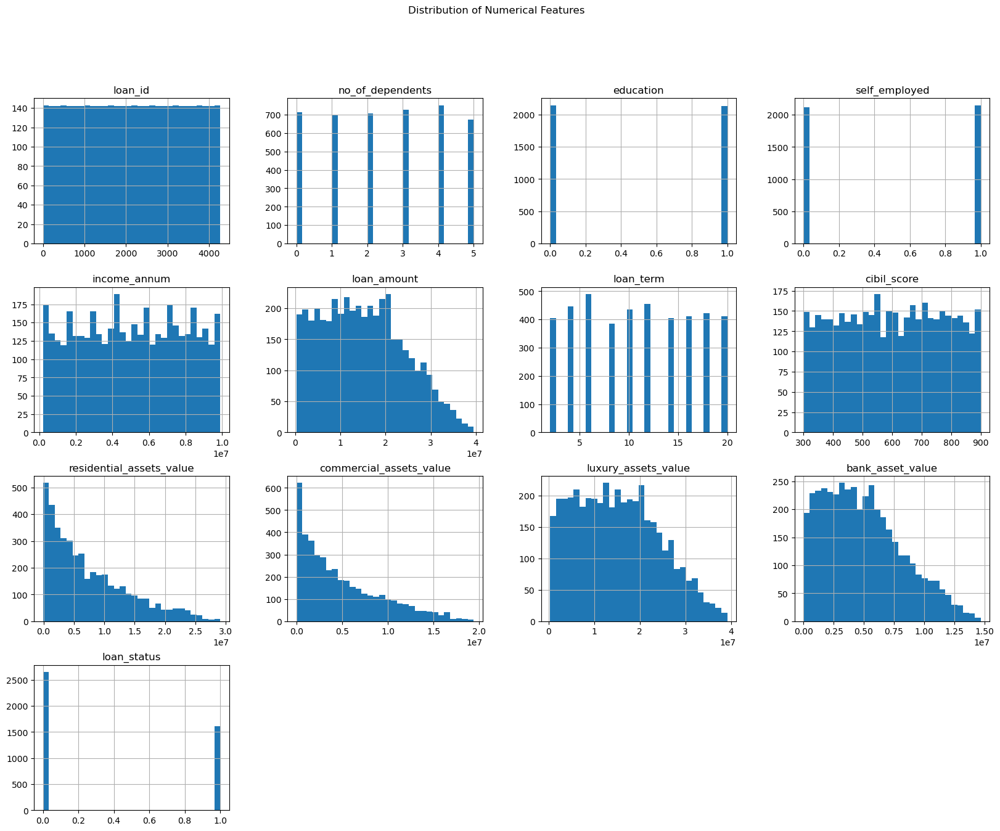

In [20]:
# Plotting
# 1. Distribution of Numerical Features
df.hist(bins=30, figsize=(20, 15))
plt.suptitle('Distribution of Numerical Features')
plt.show()

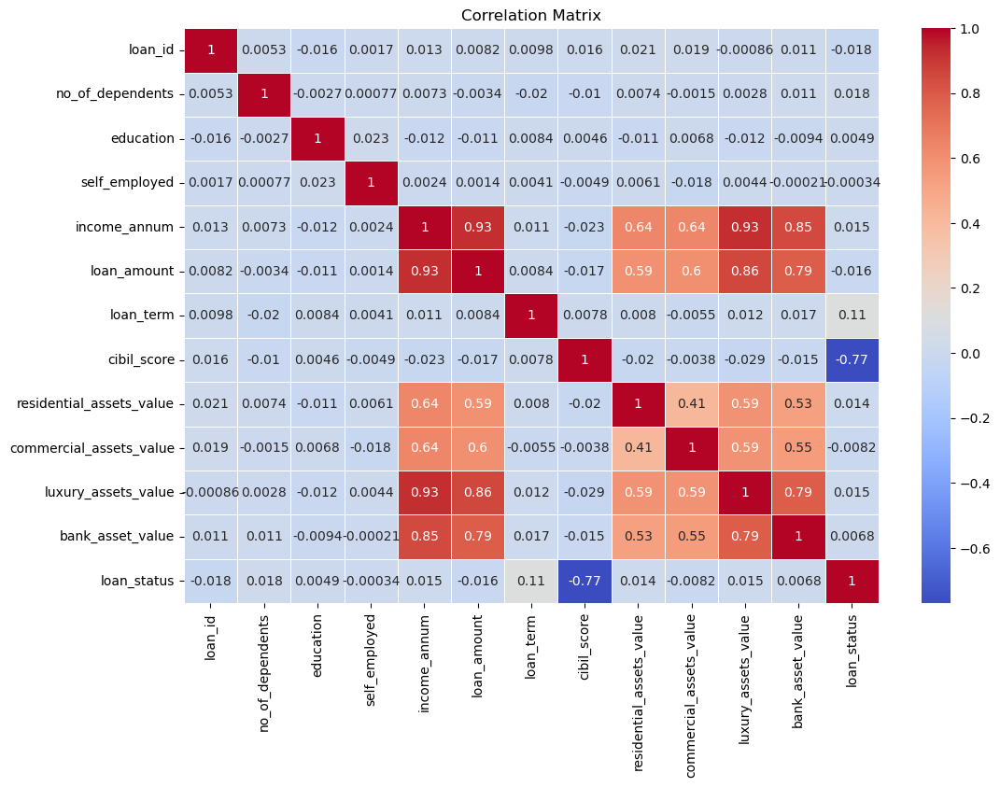

In [21]:
# 2. Correlation Matrix
plt.figure(figsize=(12, 8))
correlation_matrix = df.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

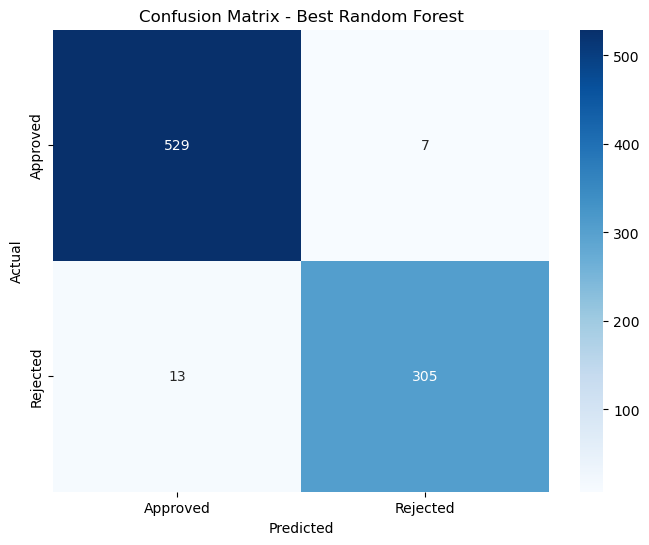

In [22]:
# 3. Confusion Matrix Heatmap for the Best Model
conf_matrix = confusion_matrix(y_test, y_pred_best_rf)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Approved', 'Rejected'], yticklabels=['Approved', 'Rejected'])
plt.title('Confusion Matrix - Best Random Forest')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


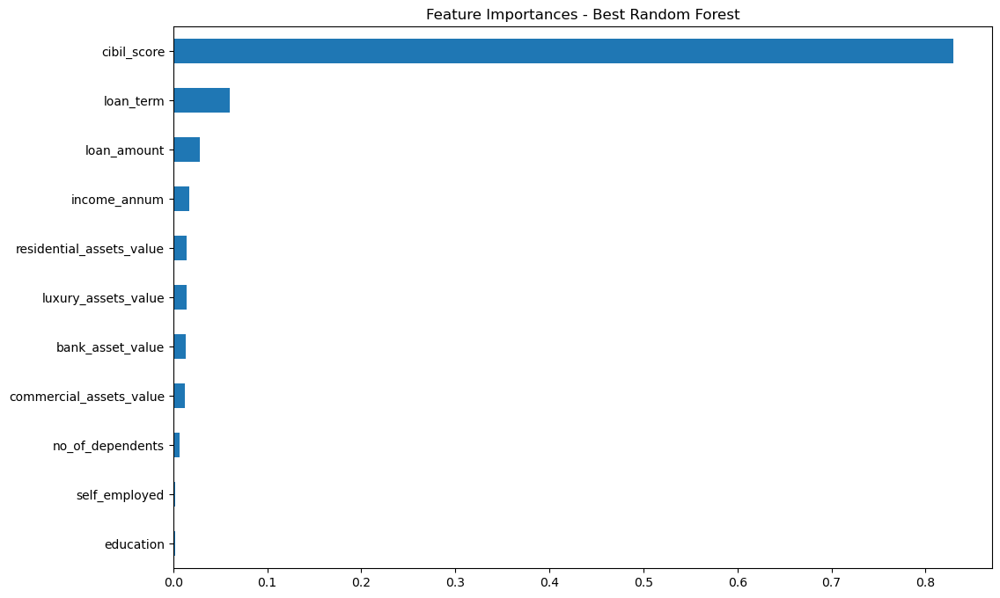

In [23]:
# 4. Feature Importance from the Best Random Forest Model
feature_importances = pd.Series(best_rf.feature_importances_, index=X.columns)
plt.figure(figsize=(12, 8))
feature_importances.sort_values().plot(kind='barh')
plt.title('Feature Importances - Best Random Forest')
plt.show()

C:\Users\anupu\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


<Figure size 1200x800 with 0 Axes>

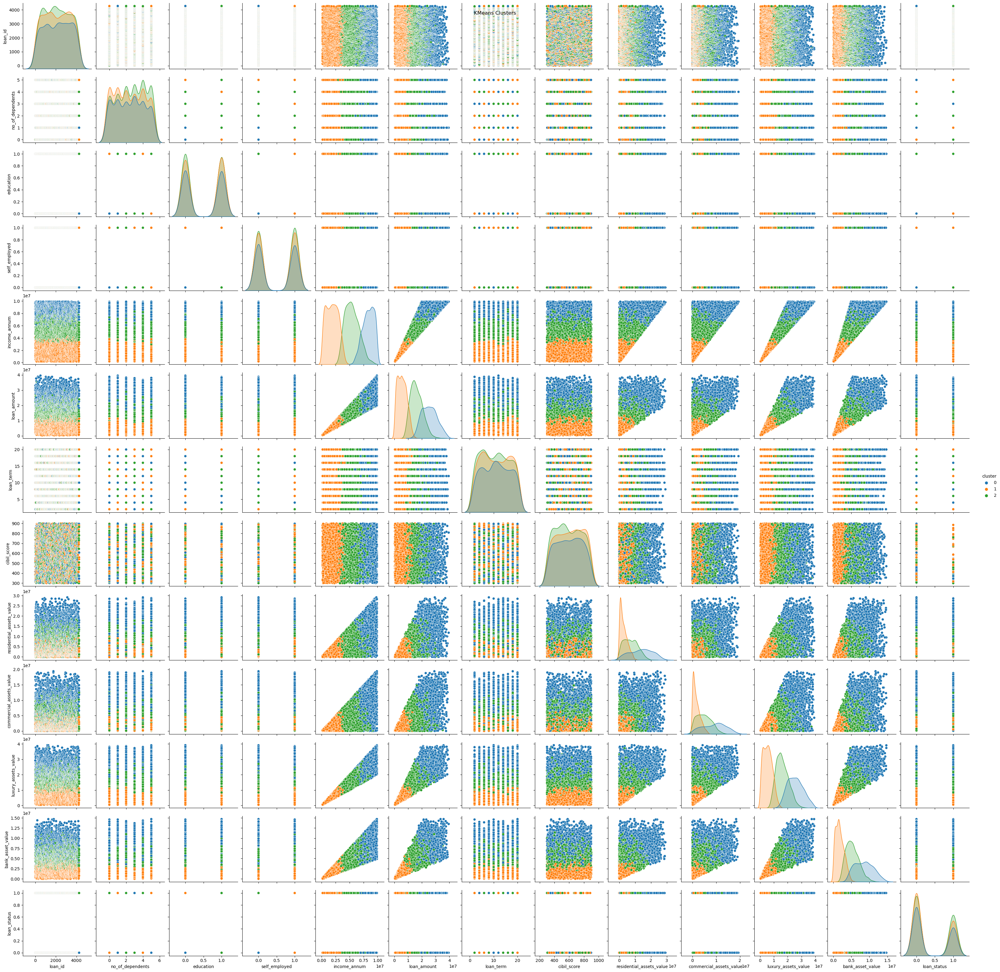

Best Random Forest with Clusters Accuracy: 0.9812646370023419
Best Random Forest with Clusters Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       536
           1       0.98      0.97      0.97       318

    accuracy                           0.98       854
   macro avg       0.98      0.98      0.98       854
weighted avg       0.98      0.98      0.98       854

Best Random Forest with Clusters Confusion Matrix:
[[529   7]
 [  9 309]]


In [25]:
from sklearn.cluster import KMeans  # Import KMeans
# Clustering with KMeans
kmeans = KMeans(n_clusters=3, random_state=42)
X_scaled = scaler.fit_transform(X)  # Scale the full feature set for clustering
df['cluster'] = kmeans.fit_predict(X_scaled)

# Visualizing clusters
plt.figure(figsize=(12, 8))
sns.pairplot(df, hue='cluster', diag_kind='kde', palette='tab10')
plt.suptitle('KMeans Clusters')
plt.show()

# Adding cluster information to train/test splits
X_train['cluster'] = kmeans.predict(X_train_scaled)
X_test['cluster'] = kmeans.predict(X_test_scaled)

# Re-train best model with cluster information
best_rf.fit(X_train, y_train)
y_pred_best_rf = best_rf.predict(X_test)

# Evaluate the model again
best_rf_accuracy = accuracy_score(y_test, y_pred_best_rf)
print(f"Best Random Forest with Clusters Accuracy: {best_rf_accuracy}")
print(f"Best Random Forest with Clusters Classification Report:\n{classification_report(y_test, y_pred_best_rf)}")
print(f"Best Random Forest with Clusters Confusion Matrix:\n{confusion_matrix(y_test, y_pred_best_rf)}")